Here we will make district segmentation based on funding and graduation rates

Caution: The following code have not been tested on the real dataframe and at this point is just schema of the future research!

In [1]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import plotly.express as px
import hvplot.pandas
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib

In [2]:
# Load data
df = pd.read_csv("All_data.csv")
df.head(10)

,Year,CDS_CODE,ETHNIC,Function,GR_12,ENR_TOTAL,GRADS,UC_GRADS,Amount
0,1213,1100170000000,1,All Other General Administration ...,1,16,2,1,4.004580e+03
1,1213,1100170000000,1,Ancillary Services ...,1,16,2,1,7.068800e+02
2,1213,1100170000000,1,Attendance and Social Work Services ...,1,16,2,1,6.885700e+02
3,1213,1100170000000,1,Board ...,1,16,2,1,3.207330e+03
4,1213,1100170000000,1,Centralized Data Processing ...,1,16,2,1,1.816585e+05
5,1213,1100170000000,1,Fiscal Services ...,1,16,2,1,4.556030e+03
6,1213,1100170000000,1,General Administration Cost Transfers ...,1,16,2,1,-2.910383e-11
7,1213,1100170000000,1,Guidance and Counseling Services ...,1,16,2,1,2.771103e+05
8,1213,1100170000000,1,Instruction ...,1,16,2,1,9.370981e+05
9,1213,1100170000000,1,"Instructional Library, Media, and Technology ...",1,16,2,1,1.336111e+04


In [3]:
df.Amount.min()

-159509.03999999998

In [4]:
df = df.loc[df.Amount >=0]
df

,Year,CDS_CODE,ETHNIC,Function,GR_12,ENR_TOTAL,GRADS,UC_GRADS,Amount
0,1213,1100170000000,1,All Other General Administration ...,1,16,2,1,4004.58
1,1213,1100170000000,1,Ancillary Services ...,1,16,2,1,706.88
2,1213,1100170000000,1,Attendance and Social Work Services ...,1,16,2,1,688.57
3,1213,1100170000000,1,Board ...,1,16,2,1,3207.33
4,1213,1100170000000,1,Centralized Data Processing ...,1,16,2,1,181658.49
...,...,...,...,...,...,...,...,...,...
65340,1617,7617960000000,7,Special Education: Separate Classes ...,398,1916,6,0,9350459.54
65341,1617,7617960000000,7,Special Education: Supplemental Aids & Service...,199,958,3,0,787136.45
65342,1617,7617960000000,7,Speech Pathology and Audiology Services ...,199,958,3,0,43792.44
65343,1617,7617960000000,7,Superintendent ...,199,958,3,0,37.33


As a first step we will encode our feautures

In [5]:
#Remove last seven digit that show the school
df['CDS_CODE'] = df['CDS_CODE'].astype(str).str[:-7].astype(np.int64)
df

,Year,CDS_CODE,ETHNIC,Function,GR_12,ENR_TOTAL,GRADS,UC_GRADS,Amount
0,1213,110017,1,All Other General Administration ...,1,16,2,1,4004.58
1,1213,110017,1,Ancillary Services ...,1,16,2,1,706.88
2,1213,110017,1,Attendance and Social Work Services ...,1,16,2,1,688.57
3,1213,110017,1,Board ...,1,16,2,1,3207.33
4,1213,110017,1,Centralized Data Processing ...,1,16,2,1,181658.49
...,...,...,...,...,...,...,...,...,...
65340,1617,761796,7,Special Education: Separate Classes ...,398,1916,6,0,9350459.54
65341,1617,761796,7,Special Education: Supplemental Aids & Service...,199,958,3,0,787136.45
65342,1617,761796,7,Speech Pathology and Audiology Services ...,199,958,3,0,43792.44
65343,1617,761796,7,Superintendent ...,199,958,3,0,37.33


In [6]:
#Group data by district
df =df.groupby(["CDS_CODE", "Year", "Function"]).sum()
df.head()

ETHNIC  \
CDS_CODE Year Function                                                     
110017   1213 All Other General Administration               ...      37   
              Ancillary Services                             ...      37   
              Attendance and Social Work Services            ...      37   
              Board                                          ...      37   
              Centralized Data Processing                    ...      37   

                                                                  GR_12  \
CDS_CODE Year Function                                                    
110017   1213 All Other General Administration               ...    262   
              Ancillary Services                             ...    262   
              Attendance and Social Work Services            ...    262   
              Board                                          ...    262   
              Centralized Data Processing                    ...    262   

                                                                  ENR_TOTAL  \
CDS_CODE Year Function                                                        
110017   1213 All Other General Administration               ...       1654   
              Ancillary Services                             ...       1654   
              Attendance and Social Work Services            ...       1654   
              Board                                          ...       1654   
              Centralized Data Processing                    ...       1654   

                                                                  GRADS  \
CDS_CODE Year Function                                                    
110017   1213 All Other General Administration               ...    221   
              Ancillary Services                             ...    221   
              Attendance and Social Work Services            ...    221   
              Board                                          ...    221   
              Centralized Data Processing                    ...    221   

                                                                  UC_GRADS  \
CDS_CODE Year Function                                                       
110017   1213 All Other General Administration               ...        81   
              Ancillary Services                             ...        81   
              Attendance and Social Work Services            ...        81   
              Board                                          ...        81   
              Centralized Data Processing                    ...        81   

                                                                      Amount  
CDS_CODE Year Function                                                        
110017   1213 All Other General Administration               ...    32036.64  
              Ancillary Services                             ...     5655.04  
              Attendance and Social Work Services            ...     5508.56  
              Board                                          ...    25658.64  
              Centralized Data Processing                    ...  1453267.92

In [7]:
#Reset index
df = df.reset_index()
df

,CDS_CODE,Year,Function,ETHNIC,GR_12,ENR_TOTAL,GRADS,UC_GRADS,Amount
0,110017,1213,All Other General Administration ...,37,262,1654,221,81,32036.64
1,110017,1213,Ancillary Services ...,37,262,1654,221,81,5655.04
2,110017,1213,Attendance and Social Work Services ...,37,262,1654,221,81,5508.56
3,110017,1213,Board ...,37,262,1654,221,81,25658.64
4,110017,1213,Centralized Data Processing ...,37,262,1654,221,81,1453267.92
...,...,...,...,...,...,...,...,...,...
9047,5772710,1516,Special Education: Resource Specialist Instruc...,34,1408,20202,1276,490,5471518.48
9048,5772710,1516,Special Education: Separate Classes ...,34,1408,20202,1276,490,12209378.80
9049,5772710,1516,Special Education: Supplemental Aids & Service...,34,1408,20202,1276,490,5113889.76
9050,5772710,1516,Speech Pathology and Audiology Services ...,34,1408,20202,1276,490,3164532.40


In [8]:
# Print out the Funds value counts
funds_counts = df.Function.value_counts()
funds_counts

Instruction                                                                                                                                                                                                                                                   420
Not Applicable (For use with revenues and balance sheet transactions only)                                                                                                                                                                                    417
Pupil Transportation                                                                                                                                                                                                                                          386
Food Services                                                                                                                                                                                                                     

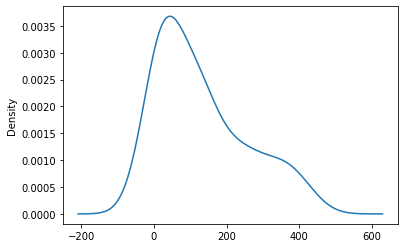

In [9]:
# Visualize the value counts
funds_counts.plot.density()

In [10]:
# Determine which values to replace
replace_funds = list(funds_counts[funds_counts < 150].index)

# Replace in DataFrame
for fund in replace_funds:
    df.Function = df.Function.replace(fund,"Other")

# Check to make sure binning was successful
df.Function.value_counts()

Other                                                                                                                                                                                                                                                         2763
Instruction                                                                                                                                                                                                                                                    420
Not Applicable (For use with revenues and balance sheet transactions only)                                                                                                                                                                                     417
Pupil Transportation                                                                                                                                                                                                           

In [11]:
# Create the OneHotEncoder instance
from sklearn.preprocessing import OneHotEncoder
enc = OneHotEncoder(sparse=False)

# Fit the encoder and produce encoded DataFrame
encode_df = pd.DataFrame(enc.fit_transform(df.Function.values.reshape(-1,1)))

# Rename encoded columns
encode_df.columns = enc.get_feature_names(['Function'])
encode_df.head()

,Function_Attendance and Social Work Services,Function_Centralized Data Processing,Function_Food Services,Function_General Administration Cost Transfers,Function_Guidance and Counseling Services,Function_Health Services,Function_Instruction,"Function_Instructional Library, Media, and Technology",Function_Instructional Supervision and Administration,Function_Maintenance,...,Function_Other General Administration,Function_Other Pupil Services,Function_Plant Maintenance and Operations,Function_Pupil Transportation,Function_School Administration,Function_Special Education: Nonpublic Agencies/Schools (NPA/S),Function_Special Education: Other Specialized Instructional Services,Function_Special Education: Resource Specialist Instruction,Function_Special Education: Separate Classes,Function_Special Education: Supplemental Aids & Services in Regular Classrooms
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [12]:
# Merge the two DataFrames together and drop the Funds column
df = df.merge(encode_df,left_index=True,right_index=True).drop("Function",1)
df

,CDS_CODE,Year,ETHNIC,GR_12,ENR_TOTAL,GRADS,UC_GRADS,Amount,Function_Attendance and Social Work Services,Function_Centralized Data Processing,...,Function_Other General Administration,Function_Other Pupil Services,Function_Plant Maintenance and Operations,Function_Pupil Transportation,Function_School Administration,Function_Special Education: Nonpublic Agencies/Schools (NPA/S),Function_Special Education: Other Specialized Instructional Services,Function_Special Education: Resource Specialist Instruction,Function_Special Education: Separate Classes,Function_Special Education: Supplemental Aids & Services in Regular Classrooms
0,110017,1213,37,262,1654,221,81,32036.64,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,110017,1213,37,262,1654,221,81,5655.04,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,110017,1213,37,262,1654,221,81,5508.56,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,110017,1213,37,262,1654,221,81,25658.64,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,110017,1213,37,262,1654,221,81,1453267.92,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9047,5772710,1516,34,1408,20202,1276,490,5471518.48,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
9048,5772710,1516,34,1408,20202,1276,490,12209378.80,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
9049,5772710,1516,34,1408,20202,1276,490,5113889.76,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
9050,5772710,1516,34,1408,20202,1276,490,3164532.40,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [13]:
#Financing description statistics
df.Amount.describe()

count    9.052000e+03
mean     6.669550e+06
std      2.296248e+07
min      0.000000e+00
25%      3.823054e+04
50%      6.382129e+05
75%      4.004388e+06
max      6.374681e+08
Name: Amount, dtype: float64

In [14]:
df.Amount.max()

637468147.9199995

Also we will apply binning to column "Amount of financing" and encode this column


In [15]:
 #split Fin_Amount into bins
groups = [0, 500000, 1500000, 3000000, 10000000, 637468147.9199995]
new_labels = ["<500k", "500k-1500k", "1500k-3000k", "3000k-10000k", ">10000k"]
df["Amount"] = pd.cut(df["Amount"], groups, labels = new_labels)
df.head()

,CDS_CODE,Year,ETHNIC,GR_12,ENR_TOTAL,GRADS,UC_GRADS,Amount,Function_Attendance and Social Work Services,Function_Centralized Data Processing,...,Function_Other General Administration,Function_Other Pupil Services,Function_Plant Maintenance and Operations,Function_Pupil Transportation,Function_School Administration,Function_Special Education: Nonpublic Agencies/Schools (NPA/S),Function_Special Education: Other Specialized Instructional Services,Function_Special Education: Resource Specialist Instruction,Function_Special Education: Separate Classes,Function_Special Education: Supplemental Aids & Services in Regular Classrooms
0,110017,1213,37,262,1654,221,81,<500k,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,110017,1213,37,262,1654,221,81,<500k,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,110017,1213,37,262,1654,221,81,<500k,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,110017,1213,37,262,1654,221,81,<500k,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,110017,1213,37,262,1654,221,81,500k-1500k,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [16]:
#Encode Fin_Amount
df = pd.get_dummies(df, columns = ['Amount'])
df

,CDS_CODE,Year,ETHNIC,GR_12,ENR_TOTAL,GRADS,UC_GRADS,Function_Attendance and Social Work Services,Function_Centralized Data Processing,Function_Food Services,...,Function_Special Education: Nonpublic Agencies/Schools (NPA/S),Function_Special Education: Other Specialized Instructional Services,Function_Special Education: Resource Specialist Instruction,Function_Special Education: Separate Classes,Function_Special Education: Supplemental Aids & Services in Regular Classrooms,Amount_<500k,Amount_500k-1500k,Amount_1500k-3000k,Amount_3000k-10000k,Amount_>10000k
0,110017,1213,37,262,1654,221,81,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0
1,110017,1213,37,262,1654,221,81,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0
2,110017,1213,37,262,1654,221,81,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0
3,110017,1213,37,262,1654,221,81,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0
4,110017,1213,37,262,1654,221,81,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9047,5772710,1516,34,1408,20202,1276,490,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0,0,0,1,0
9048,5772710,1516,34,1408,20202,1276,490,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0,0,0,0,1
9049,5772710,1516,34,1408,20202,1276,490,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0,0,0,1,0
9050,5772710,1516,34,1408,20202,1276,490,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0,0,0,1,0


In [17]:
#Export preprocessed df to csv to use ot in ML model
df.to_csv('Sources/df_encoded.csv')

Next step will be standardization of the data and applying PCA

In [18]:
#Standardize the features
df_scaled=StandardScaler().fit_transform(df)
print(df_scaled[0:5])

[[-1.04684303 -1.32941398  0.63915216 -0.58213997 -0.55175466 -0.59639553
  -0.56217653 -0.13625874 -0.16503208 -0.21019137 -0.1660886  -0.16110522
  -0.17964626 -0.22058142 -0.19664425 -0.16038198 -0.14602948 -0.21975403
  -0.17433506  1.50869119 -0.20144324 -0.13667872 -0.18062684 -0.21104949
  -0.20262793 -0.14642355 -0.17467117 -0.19143358 -0.19965507 -0.15635041
   1.07148394 -0.40859024 -0.32150305 -0.41318167 -0.40987803]
 [-1.04684303 -1.32941398  0.63915216 -0.58213997 -0.55175466 -0.59639553
  -0.56217653 -0.13625874 -0.16503208 -0.21019137 -0.1660886  -0.16110522
  -0.17964626 -0.22058142 -0.19664425 -0.16038198 -0.14602948 -0.21975403
  -0.17433506  1.50869119 -0.20144324 -0.13667872 -0.18062684 -0.21104949
  -0.20262793 -0.14642355 -0.17467117 -0.19143358 -0.19965507 -0.15635041
   1.07148394 -0.40859024 -0.32150305 -0.41318167 -0.40987803]
 [-1.04684303 -1.32941398  0.63915216 -0.58213997 -0.55175466 -0.59639553
  -0.56217653  7.33897854 -0.16503208 -0.21019137 -0.1660886

In [19]:
#Initialize PCA model
pca = PCA(n_components =2)
df_pca = pca.fit_transform(df_scaled)
#Transform principal components into a data frame to fit K-Means
new_df_pca = pd.DataFrame( data = df_pca, columns=['principal component 1', 'principal component 2'])
new_df_pca.head()

,principal component 1,principal component 2
0,-1.276431,1.627664
1,-1.276431,1.627664
2,-1.232710,0.870996
3,-1.276431,1.627664
4,-1.045094,-0.941382


In [20]:
#Learn how much information can be attributed to each principal component
pca.explained_variance_ratio_

array([0.12143944, 0.05510285])

Building Elbow Curve to find number of clusters

In [21]:
inertia = []
k = list(range(1, 11))
# Calculate the inertia for the range of K values
for i in k:
    km = KMeans(n_clusters=i, random_state=0)
    km.fit(df)
    inertia.append(km.inertia_)

In [22]:
#Create a plot for elbow_curve
elbow_data={"k":k, "inertia": inertia}
df_elbow = pd.DataFrame(elbow_data)
elbow = df_elbow.hvplot.line(x="k", y="inertia", title="Elbow Curve", xticks = k)
hvplot.save(elbow, 'PNG/elbow_2PC.png')
elbow

:Curve   [k]   (inertia)

Use KMeans method to decide how many clusters to implement

In [23]:
# Create a copy of the DataFrame
data = new_df_pca.copy()
def get_clusters(k, data):
    # Create a copy of the DataFrame
    #data = df.copy()
    # Initialize the K-Means model
    model = KMeans(n_clusters=k, random_state=0)
    # Fit the model
    model.fit(data)
    # Predict clusters
    predictions = model.predict(data)
    # Create return DataFrame with predicted clusters
    data["Cluster"] = model.labels_
    return data
data

,principal component 1,principal component 2
0,-1.276431,1.627664
1,-1.276431,1.627664
2,-1.232710,0.870996
3,-1.276431,1.627664
4,-1.045094,-0.941382
...,...,...
9047,0.238609,-1.507503
9048,1.056583,-1.471489
9049,0.245944,-1.301220
9050,0.284990,0.150716


In [24]:
#Run 3 Clusters
three_clusters = get_clusters(3, data)
three_clusters.head()

,principal component 1,principal component 2,Cluster
0,-1.276431,1.627664,2
1,-1.276431,1.627664,2
2,-1.232710,0.870996,2
3,-1.276431,1.627664,2
4,-1.045094,-0.941382,1


In [25]:
three_clusters_2d = three_clusters.hvplot.scatter(x='principal component 1', y="principal component 2", by="Cluster")
hvplot.save(three_clusters_2d, 'PNG/three_clusters_2d.png')
three_clusters_2d

:NdOverlay   [Cluster]
   :Scatter   [principal component 1]   (principal component 2)

In [26]:
#Run 4 Clusters
four_clusters = get_clusters(4, data)
four_clusters.head()

,principal component 1,principal component 2,Cluster
0,-1.276431,1.627664,0
1,-1.276431,1.627664,0
2,-1.232710,0.870996,0
3,-1.276431,1.627664,0
4,-1.045094,-0.941382,2


In [27]:
four_clusters_2d = four_clusters.hvplot.scatter(x='principal component 1', y="principal component 2", by="Cluster")
hvplot.save(four_clusters_2d, 'PNG/four_clusters_2d.png')
four_clusters_2d

:NdOverlay   [Cluster]
   :Scatter   [principal component 1]   (principal component 2)

As we have low explained variance ratio, it was decided to use three principal components

In [28]:
#Initialize PCA model
pca = PCA(n_components =3)
df_pca = pca.fit_transform(df_scaled)
#Transform principal components into a data frame to fit K-Means
new_df_pca = pd.DataFrame( data = df_pca, columns=['principal component 1', 'principal component 2', 'principal component 3'])
new_df_pca.head()

,principal component 1,principal component 2,principal component 3
0,-1.276377,1.627551,-0.047944
1,-1.276377,1.627551,-0.047944
2,-1.232554,0.877664,-0.095576
3,-1.276377,1.627551,-0.047944
4,-1.045100,-0.891666,-0.730700


In [29]:
#Learn how much information can be attributed to each principal component
pca.explained_variance_ratio_

array([0.12143944, 0.05510663, 0.03820499])

Building Elbow Curve to find number of clusters

In [30]:
inertia = []
k = list(range(1, 11))
# Calculate the inertia for the range of K values
for i in k:
    km = KMeans(n_clusters=i, random_state=0)
    km.fit(df)
    inertia.append(km.inertia_)

In [31]:
#Create a plot for elbow_curve
elbow_data={"k":k, "inertia": inertia}
df_elbow = pd.DataFrame(elbow_data)
elbow = df_elbow.hvplot.line(x="k", y="inertia", title="Elbow Curve", xticks = k)
hvplot.save(elbow, 'PNG/elbow_3PC.png')
elbow

:Curve   [k]   (inertia)

Use KMeans method to decide how many clusters to implement

In [32]:
# Create a copy of the DataFrame
data = new_df_pca.copy()
def get_clusters(k, data):
    # Create a copy of the DataFrame
    #data = df.copy()
    # Initialize the K-Means model
    model = KMeans(n_clusters=k, random_state=0)
    # Fit the model
    model.fit(data)
    # Predict clusters
    predictions = model.predict(data)
    # Create return DataFrame with predicted clusters
    data["Cluster"] = model.labels_
    return data
data

,principal component 1,principal component 2,principal component 3
0,-1.276377,1.627551,-0.047944
1,-1.276377,1.627551,-0.047944
2,-1.232554,0.877664,-0.095576
3,-1.276377,1.627551,-0.047944
4,-1.045100,-0.891666,-0.730700
...,...,...,...
9047,0.238431,-1.480982,-1.668784
9048,1.056545,-1.435308,2.625652
9049,0.246042,-1.329192,-2.049255
9050,0.284962,0.149316,-1.368431


In [33]:
#Run 3 Clusters
three_clusters = get_clusters(3, data)
three_clusters.head()

,principal component 1,principal component 2,principal component 3,Cluster
0,-1.276377,1.627551,-0.047944,2
1,-1.276377,1.627551,-0.047944,2
2,-1.232554,0.877664,-0.095576,2
3,-1.276377,1.627551,-0.047944,2
4,-1.045100,-0.891666,-0.730700,0


In [34]:
#Create a 3D scatter plot using Plotly Express to plot the clusters using the clustered_df DataFrame
fig = px.scatter_3d(
    three_clusters,
    x="principal component 1",
    y="principal component 2",
    z="principal component 3",
    color="Cluster",
    symbol="Cluster",
    width=800
)
fig.update_layout(legend=dict(x=0, y=1))
fig.show()


In [35]:
#Run 3 Clusters
four_clusters = get_clusters(4, data)
four_clusters.head()

,principal component 1,principal component 2,principal component 3,Cluster
0,-1.276377,1.627551,-0.047944,2
1,-1.276377,1.627551,-0.047944,2
2,-1.232554,0.877664,-0.095576,2
3,-1.276377,1.627551,-0.047944,2
4,-1.045100,-0.891666,-0.730700,0


In [36]:
#Create a 3D scatter plot using Plotly Express to plot the clusters using the clustered_df DataFrame
fig = px.scatter_3d(
    four_clusters,
    x="principal component 1",
    y="principal component 2",
    z="principal component 3",
    color="Cluster",
    symbol="Cluster",
    width=800
)
fig.update_layout(legend=dict(x=0, y=1))
fig.show()



It was decided to use three clusters

In [37]:
#Create new dataframe that includes the columns from pcs_df and original data
clustered_df = pd.merge(df, three_clusters, left_index=True, right_index=True)
clustered_df

,CDS_CODE,Year,ETHNIC,GR_12,ENR_TOTAL,GRADS,UC_GRADS,Function_Attendance and Social Work Services,Function_Centralized Data Processing,Function_Food Services,...,Function_Special Education: Supplemental Aids & Services in Regular Classrooms,Amount_<500k,Amount_500k-1500k,Amount_1500k-3000k,Amount_3000k-10000k,Amount_>10000k,principal component 1,principal component 2,principal component 3,Cluster
0,110017,1213,37,262,1654,221,81,0.0,0.0,0.0,...,0.0,1,0,0,0,0,-1.276377,1.627551,-0.047944,2
1,110017,1213,37,262,1654,221,81,0.0,0.0,0.0,...,0.0,1,0,0,0,0,-1.276377,1.627551,-0.047944,2
2,110017,1213,37,262,1654,221,81,1.0,0.0,0.0,...,0.0,1,0,0,0,0,-1.232554,0.877664,-0.095576,2
3,110017,1213,37,262,1654,221,81,0.0,0.0,0.0,...,0.0,1,0,0,0,0,-1.276377,1.627551,-0.047944,2
4,110017,1213,37,262,1654,221,81,0.0,1.0,0.0,...,0.0,0,1,0,0,0,-1.045100,-0.891666,-0.730700,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9047,5772710,1516,34,1408,20202,1276,490,0.0,0.0,0.0,...,0.0,0,0,0,1,0,0.238431,-1.480982,-1.668784,0
9048,5772710,1516,34,1408,20202,1276,490,0.0,0.0,0.0,...,0.0,0,0,0,0,1,1.056545,-1.435308,2.625652,3
9049,5772710,1516,34,1408,20202,1276,490,0.0,0.0,0.0,...,1.0,0,0,0,1,0,0.246042,-1.329192,-2.049255,0
9050,5772710,1516,34,1408,20202,1276,490,0.0,0.0,0.0,...,0.0,0,0,0,1,0,0.284962,0.149316,-1.368431,0


In [38]:
#Export df with clusters to csv
clustered_df.to_csv('Sources/df_clustered.csv')